# Load the Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
import cv2
import imghdr

# Load the Dataset

In [2]:
train_dir = 'Vegetable_Images/train/'
validation_dir = 'Vegetable_Images/validation/'
test_dir = 'Vegetable_Images/test/'

In [3]:
class_dir = os.listdir(train_dir)
class_lengths = {}

for class_dir in class_dir:
    # Construct the full path to the class directory
    full_path = os.path.join(train_dir, class_dir)
    if os.path.isdir(full_path):
        # Count the number of files in the class directory
        class_length = len(os.listdir(full_path))
        # Store the class name and its length in the dictionary
        class_lengths[class_dir.lower()] = class_length

# Print the result
for class_name, length in class_lengths.items():
    print(f"{class_name} = {length} of the class")

bean = 1000 of the class
bitter_gourd = 1000 of the class
bottle_gourd = 1000 of the class
brinjal = 1000 of the class
broccoli = 1000 of the class
cabbage = 1000 of the class
capsicum = 1000 of the class
carrot = 1000 of the class
cauliflower = 1000 of the class
cucumber = 1000 of the class
papaya = 1000 of the class
potato = 1000 of the class
pumpkin = 1000 of the class
radish = 1000 of the class
tomato = 1000 of the class


In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

data_train = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle = True
)

validation_datagen = ImageDataGenerator(rescale=1./255)

data_validation = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle = False 
)

Found 15000 images belonging to 15 classes.
Found 3000 images belonging to 15 classes.


In [5]:
data_iterator = iter(data_train)
batch = next(data_iterator)
images, labels = batch

In [6]:
# Image represented as numpay array
batch[0].shape

(32, 224, 224, 3)

In [7]:
batch[1]

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0.

In [10]:
for k, v in data_train.class_indices.items():
    print(str(v)+'.', k)

0. Bean
1. Bitter_Gourd
2. Bottle_Gourd
3. Brinjal
4. Broccoli
5. Cabbage
6. Capsicum
7. Carrot
8. Cauliflower
9. Cucumber
10. Papaya
11. Potato
12. Pumpkin
13. Radish
14. Tomato


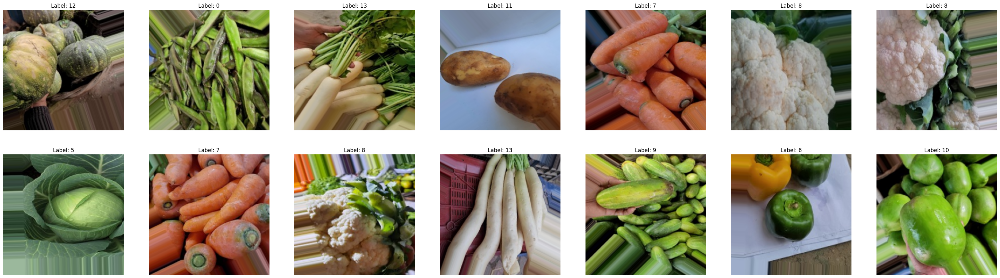

In [9]:
def visualize_batch(data_generator):
    # Get a batch of data
    images, labels = next(data_generator)
    
    # Plot the images
    plt.figure(figsize=(40,40))
    for i in range(min(32, 14)):
        plt.subplot(7, 7, i + 1)
        plt.imshow(images[i])
        label = labels[i] if labels.ndim == 1 else labels[i].argmax()  # Adjust for categorical labels
        plt.title(f'Label: {label}')
        plt.axis('off')
    plt.show()

visualize_batch(data_train)

# Build an Architecture

In [10]:
def create_model():
    
    model = tf.keras.models.Sequential([
        tf.keras.layers.Conv2D(16, (3,3), 1, padding='same', activation='relu', input_shape=(224, 224, 3)),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Conv2D(32, (3,3), 1, padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Conv2D(64, (2,2), 1, padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D(2, 2),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(15, activation='softmax')
    ])

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                 loss=tf.keras.losses.CategoricalCrossentropy(),
                 metrics=['accuracy'])

    return model

In [11]:
early_stopping= tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3,restore_best_weights=True)

# Build the Model

In [12]:
model = create_model()

In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 64)        8256      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 64)       0

In [14]:
history = model.fit(data_train,
                    epochs=50,
                    validation_data=data_validation,
                    steps_per_epoch=15000//32,
                    validation_steps=3000//32,
                    callbacks=early_stopping)

Epoch 1/50
468/468 [==============================] - 141s 292ms/step - loss: 2.0460 - accuracy: 0.3397 - val_loss: 1.4707 - val_accuracy: 0.5349
Epoch 2/50
468/468 [==============================] - 134s 286ms/step - loss: 1.4152 - accuracy: 0.5265 - val_loss: 1.1827 - val_accuracy: 0.6317
Epoch 3/50
468/468 [==============================] - 133s 284ms/step - loss: 1.2288 - accuracy: 0.5963 - val_loss: 1.0630 - val_accuracy: 0.6307
Epoch 4/50
468/468 [==============================] - 134s 285ms/step - loss: 1.0784 - accuracy: 0.6477 - val_loss: 0.8650 - val_accuracy: 0.7127
Epoch 5/50
468/468 [==============================] - 151s 324ms/step - loss: 0.9770 - accuracy: 0.6806 - val_loss: 0.8319 - val_accuracy: 0.7211
Epoch 6/50
468/468 [==============================] - 248s 530ms/step - loss: 0.8895 - accuracy: 0.7131 - val_loss: 0.7658 - val_accuracy: 0.7366
Epoch 7/50
468/468 [==============================] - 249s 531ms/step - loss: 0.8275 - accuracy: 0.7338 - val_loss: 0.6403 -

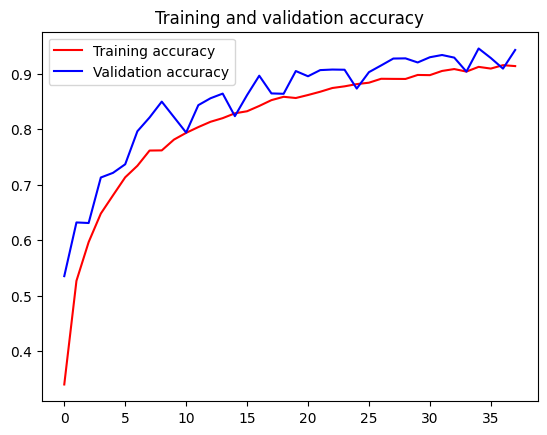

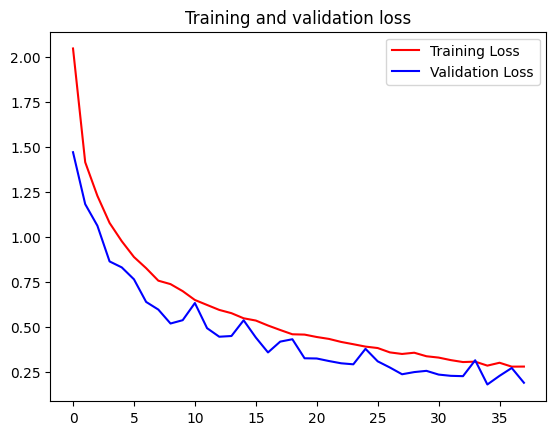

In [18]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# Evaluate The Model

In [5]:
test_datagen = ImageDataGenerator(rescale=1./255)

data_test = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle = False 
)

Found 3000 images belonging to 15 classes.


In [17]:
accuracy_score = model.evaluate(data_test)
print(accuracy_score)
print("Accuracy: {:.4f}%".format(accuracy_score[1] * 100)) 
 
print("Loss: ",accuracy_score[0])

94/94 [==============================] - 22s 230ms/step - loss: 0.1832 - accuracy: 0.9473
[0.18321719765663147, 0.9473333358764648]
Accuracy: 94.7333%
Loss:  0.18321719765663147


94/94 [==============================] - 4s 43ms/step


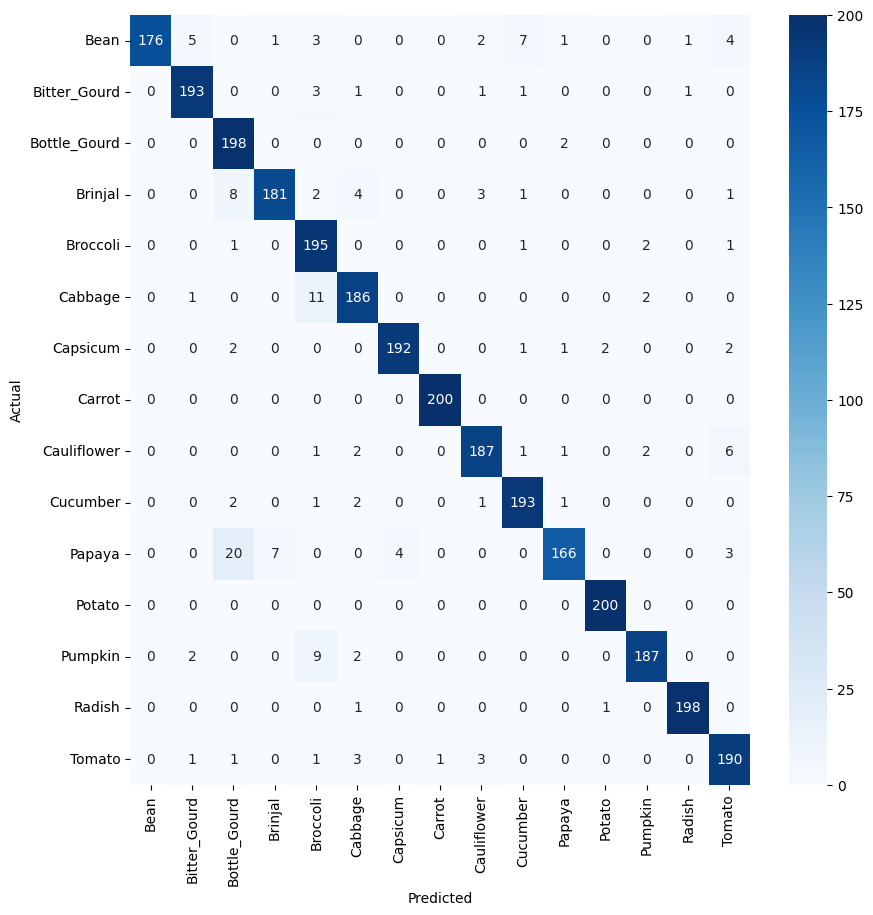

In [19]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

Y_pred = model.predict(data_test)
y_pred = np.argmax(Y_pred, axis=1)
y_true = data_test.classes
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=data_test.class_indices.keys(), yticklabels=data_test.class_indices.keys())
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

# Test the Model

In [12]:
class_indices = {v: k for k, v in data_test.class_indices.items()}
class_indices

{0: 'Bean',
 1: 'Bitter_Gourd',
 2: 'Bottle_Gourd',
 3: 'Brinjal',
 4: 'Broccoli',
 5: 'Cabbage',
 6: 'Capsicum',
 7: 'Carrot',
 8: 'Cauliflower',
 9: 'Cucumber',
 10: 'Papaya',
 11: 'Potato',
 12: 'Pumpkin',
 13: 'Radish',
 14: 'Tomato'}

In [31]:
predictions = model.predict(data_test)
predicted_classes = np.argmax(predictions, axis=1) if predictions.shape[1] > 1 else (predictions > 0.5).astype("int32")

# Function to visualize the images and their predicted labels
def visualize_predictions(data_generator, predictions, class_indices):
    images, true_labels = next(data_generator)
    plt.figure(figsize=(50, 50))
    for i in range(min(32, 15)):
        plt.subplot(7, 7, i + 1)
        plt.imshow(images[i])
        predicted_label = class_indices[predictions[i]]
        plt.title(f'Predicted: {predicted_label}')
        plt.axis('off')
    plt.show()


94/94 [==============================] - 5s 52ms/step


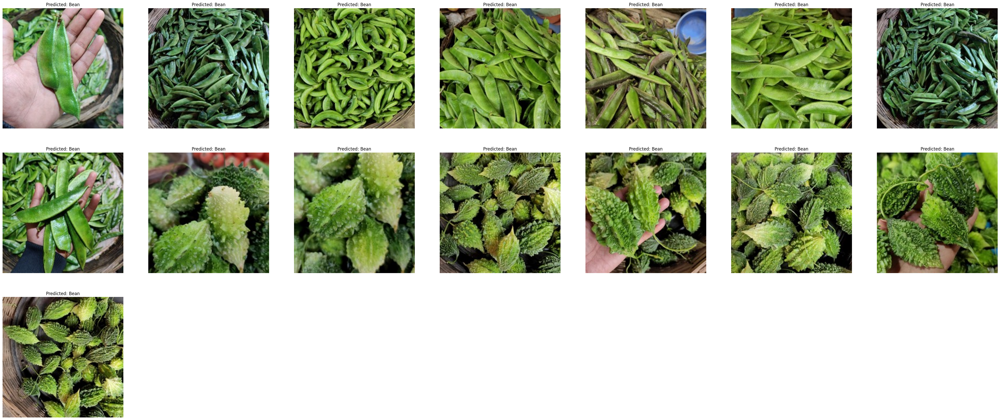

In [32]:
visualize_predictions(data_test, predicted_classes, class_indices)

In [34]:
model.save('fourthmodel.h5')
print('Model Saved!')

Model Saved!


In [6]:
from tensorflow.keras.models import load_model
savedModel=load_model('fourthmodel.h5')
savedModel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 64)        8256      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 64)       0